In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os

In [3]:
from pathlib import Path
import json
from random import randint
from collections import Counter
from collections import defaultdict

In [4]:
import json 
from PIL import Image, ImageDraw
from IPython.display import display
from shapely import wkt
from shapely.geometry.multipolygon import MultiPolygon

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
from copy import copy 

%matplotlib inline
# figure size in inches optional
rcParams['figure.figsize'] = 30, 30
plt.rcParams['legend.title_fontsize'] = 14

In [6]:
# CODE FOR THIS CELL IS TAKEN FROM https://www.kaggle.com/alexisbcook/interactive-maps
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [47]:
# CODE FOR THIS CELL IS TAKEN FROM https://www.kaggle.com/alexisbcook/interactive-maps
# Function for displaying the map
def embed_map(m, file_name):
    from IPython.display import IFrame
    m.save(file_name)
    return IFrame(file_name, width='100%', height='500px')

In [48]:
# Fetch all post disaster json files
labels_generator = Path('../data/tier3/labels').rglob(pattern=f'*post_*.json')

In [49]:
# Group json files by disaster
def get_disaster_dict(labels_generator):    
    disaster_dict = defaultdict(list)
    for label in labels_generator:
        disaster_type = label.name.split('_')[0]
        disaster_dict[disaster_type].append(str(label))
    return disaster_dict

In [50]:
disaster_dict = get_disaster_dict(labels_generator)

In [51]:
# List of Disasters present in the dataset
disaster_dict.keys()

dict_keys(['joplin-tornado', '.', 'lower-puna-volcano', 'moore-tornado', 'nepal-flooding', 'pinery-bushfire', 'portugal-wildfire', 'sunda-tsunami', 'tuscaloosa-tornado', 'woolsey-fire'])

In [52]:
# Select a particular disaster
disaster_labels = disaster_dict['joplin-tornado']

In [53]:
def read_label(label_path):
    with open(label_path) as json_file:
        image_json = json.load(json_file)
        return image_json

In [54]:
# Color codes for polygons
damage_dict = {
    "no-damage": (0, 255, 0, 50),
    "minor-damage": (0, 0, 255, 50),
    "major-damage": (255, 69, 0, 50),
    "destroyed": (255, 0, 0, 50),
    "un-classified": (255, 255, 255, 50)
}

In [55]:
def get_damage_type(properties):
    if 'subtype' in properties:
        return properties['subtype']
    else:
        return 'no-damage'

In [56]:
def annotate_img(draw, coords):
        wkt_polygons = []

        for coord in coords:
            damage = get_damage_type(coord['properties'])
            wkt_polygons.append((damage, coord['wkt']))

        polygons = []

        for damage, swkt in wkt_polygons:
            polygons.append((damage, wkt.loads(swkt)))

        for damage, polygon in polygons:
            x,y = polygon.exterior.coords.xy
            coords = list(zip(x,y))
            draw.polygon(coords, damage_dict[damage])

        del draw

In [57]:
def display_img(json_path, time='post', annotated=True):
    if time=='pre':
        json_path = json_path.replace('post', 'pre')
        
    img_path = json_path.replace('labels', 'images').replace('json','png')
        
    image_json = read_label(json_path)
    img_name = image_json['metadata']['img_name']
        
    print(img_name)
    
    img = Image.open(img_path)
    draw = ImageDraw.Draw(img, 'RGBA')
    
    if annotated:
        annotate_img(draw, image_json['features']['xy'])

    return img

In [58]:
def plot_image(label):

    # read images
    img_A = display_img(label, time='pre', annotated=False)
    img_B = display_img(label, time='post', annotated=False)
    img_C = display_img(label, time='pre', annotated=True)
    img_D = display_img(label, time='post', annotated=True)


    # display images
    fig, ax = plt.subplots(2,2)
    fig.set_size_inches(30, 30)
    TITLE_FONT_SIZE = 24
    ax[0][0].imshow(img_A);
    ax[0][0].set_title('Pre Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[0][1].imshow(img_B);
    ax[0][1].set_title('Post Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][0].imshow(img_C);
    ax[1][0].set_title('Pre Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][1].imshow(img_D);
    ax[1][1].set_title('Post Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    plt.savefig('split_image.png', dpi = 100)
    plt.show()

In [59]:
disaster_labels[0]

'../data/tier3/labels/joplin-tornado_00000000_post_disaster.json'

joplin-tornado_00000000_post_disaster.png


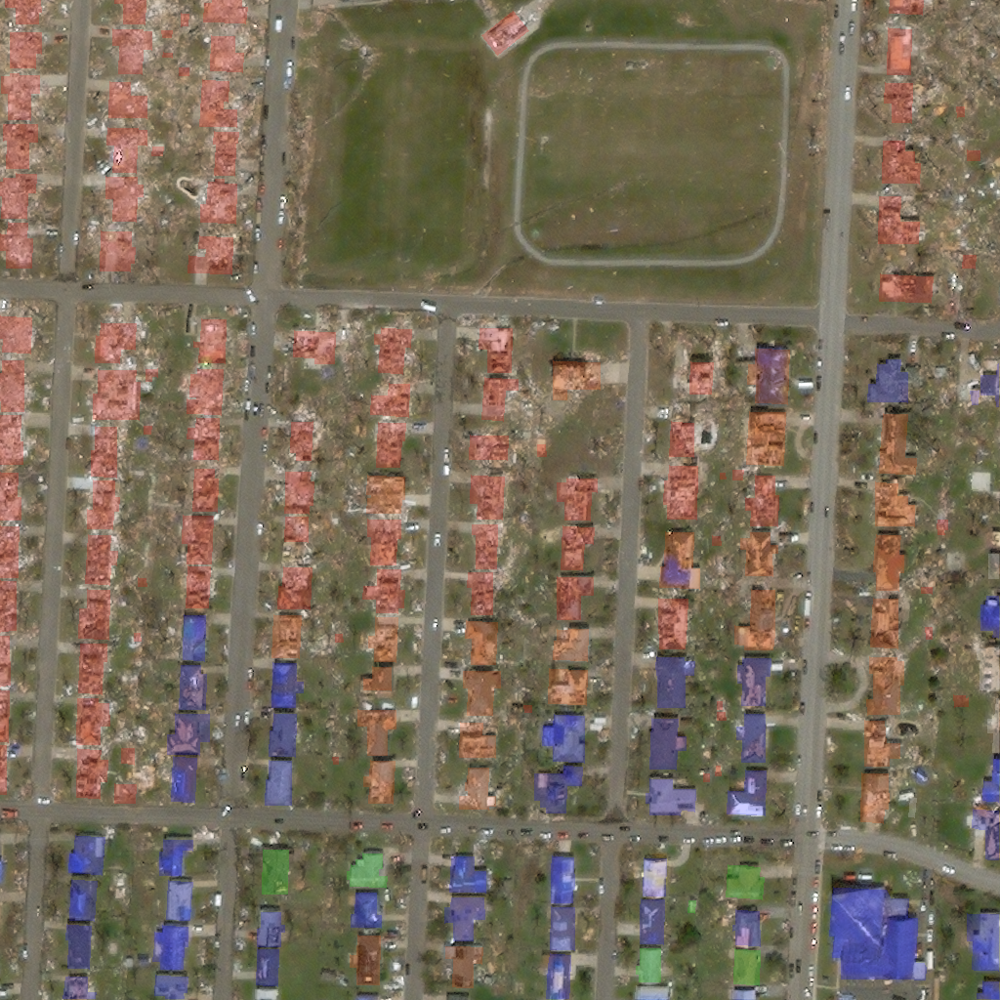

In [60]:
# Display a single image using label path. 
# `time` argument shows post or pre disaster images
# `annotated` argument labels images
display_img(disaster_labels[0], time='post', annotated=True)

In [61]:
# Get polygons center coords (lat, long)
def get_centroid(coords):
    polygons = [ wkt.loads(polygon['wkt']) for polygon in coords ]
    centroid =  MultiPolygon(polygons).centroid
    try:
        return {'centroid_x': centroid.x, 'centroid_y': centroid.y, 'latlong': centroid }
    except IndexError as e:
        return {'centroid_x': None, 'centroid_y': None, 'latlong': None }

In [62]:
def get_damage_dict(coords):
    damage_list = [ get_damage_type(coord['properties']) for coord in coords]
    return Counter(damage_list)

In [63]:
# Add centroid and damage dict to metadata
def metadata_with_damage(label_path):
    data = read_label(label_path)
    coords = data['features']['lng_lat']
    
    damage_dict = get_damage_dict(coords)
    centroid = get_centroid(coords)
    
    data['metadata'].update(centroid)
    data['metadata']['path'] = label_path
    data['metadata'].update(damage_dict)
    return data['metadata']
        
    

In [64]:
def generate_metadata_df(disaster_labels):
    metadata_list = [metadata_with_damage(label_path) for label_path in disaster_labels]
    df = pd.DataFrame(metadata_list)
    return df.fillna(df.mean())

In [65]:
# Sort df by destroyed count
df = generate_metadata_df(disaster_labels)
sorted_df = df.sort_values(by=['destroyed'], ascending=False)

GEOSException: UnsupportedOperationException: getX called on empty Point


In [44]:
sorted_df

NameError: name 'sorted_df' is not defined

In [66]:
df_generator = sorted_df.iterrows()

NameError: name 'sorted_df' is not defined

In [67]:
# Generate Google Maps link to location
from IPython.core.display import display, HTML
def generate_gmaps_link(lat, long):
    link = f"https://www.google.com/maps/@?api=1&map_action=map&center={lat},{long}&zoom=18&basemap=satellite"
    return HTML(f"""<a href="{link}" target="_blank">{link}</a>""")

/var/folders/pr/9snlxwss5lb7f1k777bxmcvr0000gn/T/ipykernel_87767/3452365405.py:2: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [28]:
# fetch first row (most damaged location)
index, row = next(df_generator)

In [29]:
# provides google maps link
generate_gmaps_link(row.centroid_y, row.centroid_x)

In [46]:
# Shows damage polygon counts for image
row[['no-damage', 'minor-damage', 'major-damage', 'destroyed', 'un-classified']]

NameError: name 'row' is not defined

In [45]:
# shows pre disaster image
display_img(row.path, time='pre', annotated=True)

NameError: name 'row' is not defined

joplin-tornado_00000147_post_disaster.png


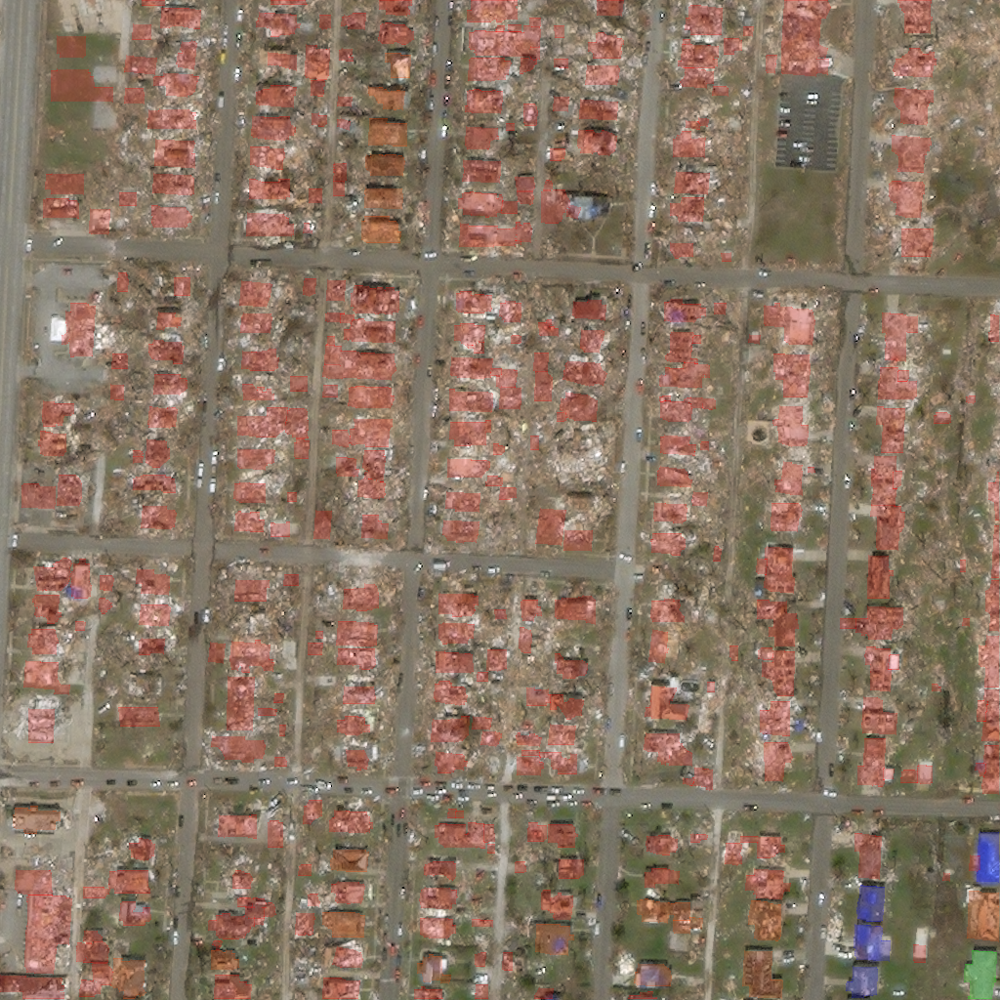

In [32]:
# shows post disaster image
display_img(row.path, time='post', annotated=True)

joplin-tornado_00000147_pre_disaster.png
joplin-tornado_00000147_post_disaster.png
joplin-tornado_00000147_pre_disaster.png
joplin-tornado_00000147_post_disaster.png


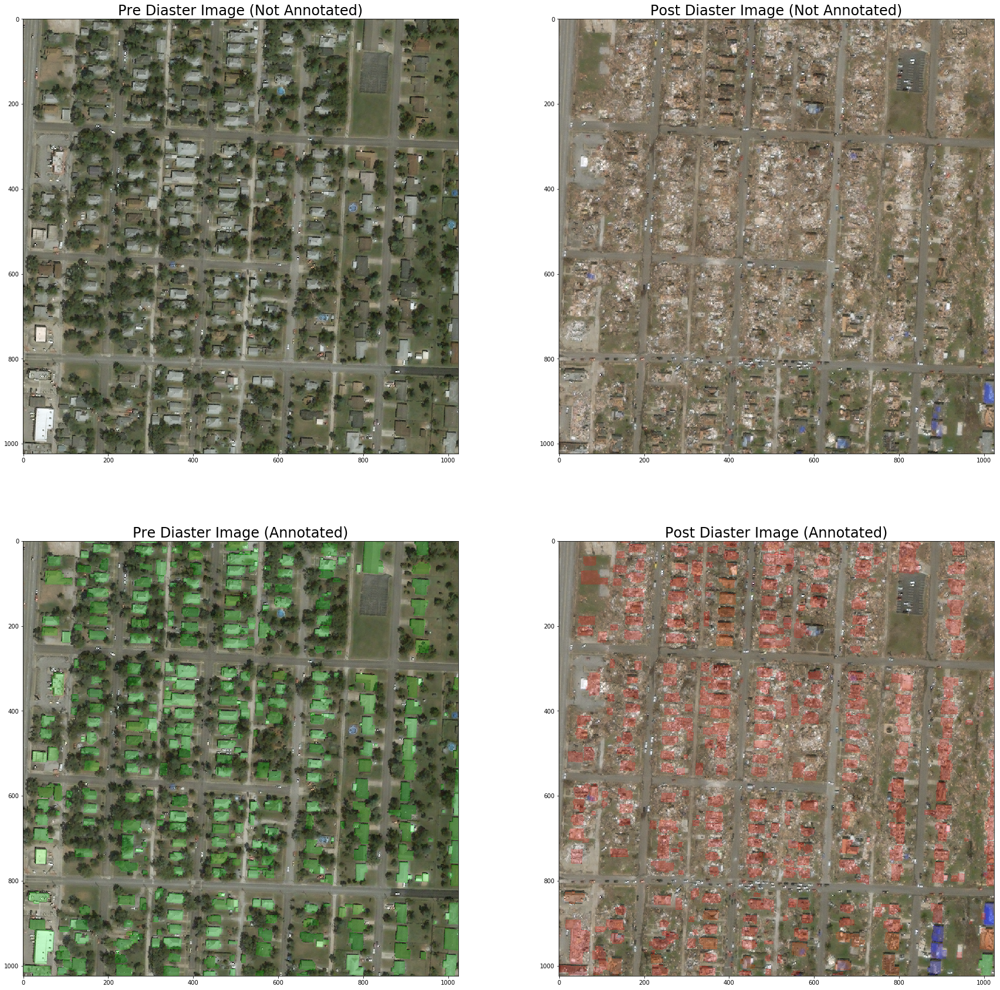

In [33]:
# plots pre and post disaster images with annotations
plot_image(row.path)

**Damaged Locations on Map**

This Map displays the affected locations by their damage type

In [34]:
def generate_circle(row):
    
    COLOR_MAP = {
        "no-damage": 'green',
        "minor-damage": 'blue',
        "major-damage": '#ffff00',
        "destroyed": 'red',
        "un-classified": 'black'
    }
    
    for damage_type, color in COLOR_MAP.items():
        yield Circle(
            location=row.loc[['centroid_y','centroid_x']].tolist(),
            radius=row.loc[damage_type],
            color=color)

In [35]:
location = df.mean().loc[['centroid_y','centroid_x']].tolist()

In [36]:
# CODE FOR THIS CELL IS TAKEN FROM https://www.kaggle.com/alexisbcook/interactive-maps

# mean latitude and longitude
# Create a map
m_2 = folium.Map(location=location, tiles='openstreetmap', zoom_start=13)

# Add points to the map
for idx, row in df.iterrows():
    generator = generate_circle(row)
    for circle in generator:
        circle.add_to(m_2)

# Display the map
embed_map(m_2, 'm_2.html')

In [37]:
labels_generator = Path('../input').rglob(pattern=f'*.json')
full_df = generate_metadata_df(labels_generator)

In [38]:
# plot bargraph based on an agg_func
def plot_bargraph(df, x, y, agg_func):
  new_df = df.groupby('disaster', as_index=False).agg(agg_func)

  for index, row in new_df.iterrows():
    plt.bar(row.disaster, row.gsd, label=row.disaster, align='center')
    
#   plt.legend(loc=1,prop={'size':18})

  plt.xticks(fontsize=22, rotation=90)
  fig = plt.gcf()
  fig.set_size_inches(30, 30)
  plt.savefig(f'{agg_func}.png', dpi=100)
  plt.show()

**Mean GSD by grouped by Disater**

The Ground Sampling Distance will help us get an idea on the spatial resolution of the images per disaster. This has help us normalize the images to a specific resolution during training.

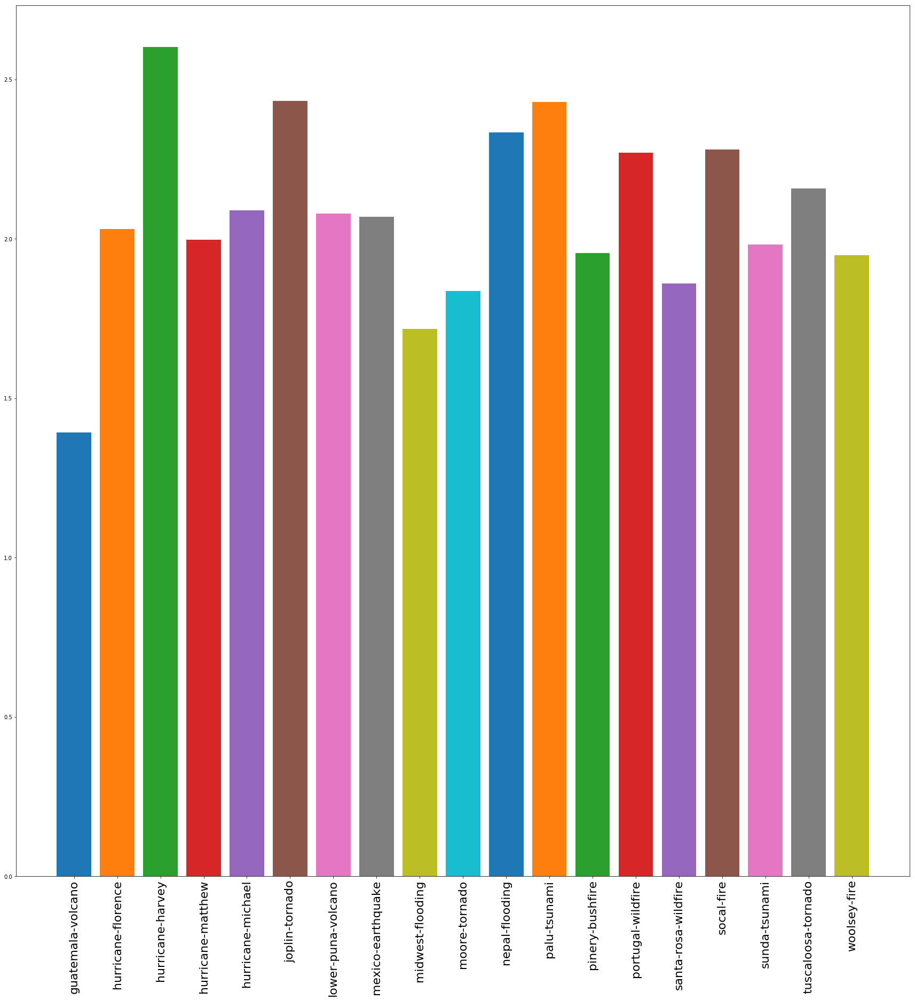

In [39]:
plot_bargraph(full_df, x='disaster', y='gsd', agg_func='mean')

In [40]:
# Mean GSD for dataset
full_df['gsd'].mean()

2.1178275874512202

**Number of images per Disaster**

The number of datapoints per dataset will give us an idea on which disaster to focus on while training our model.

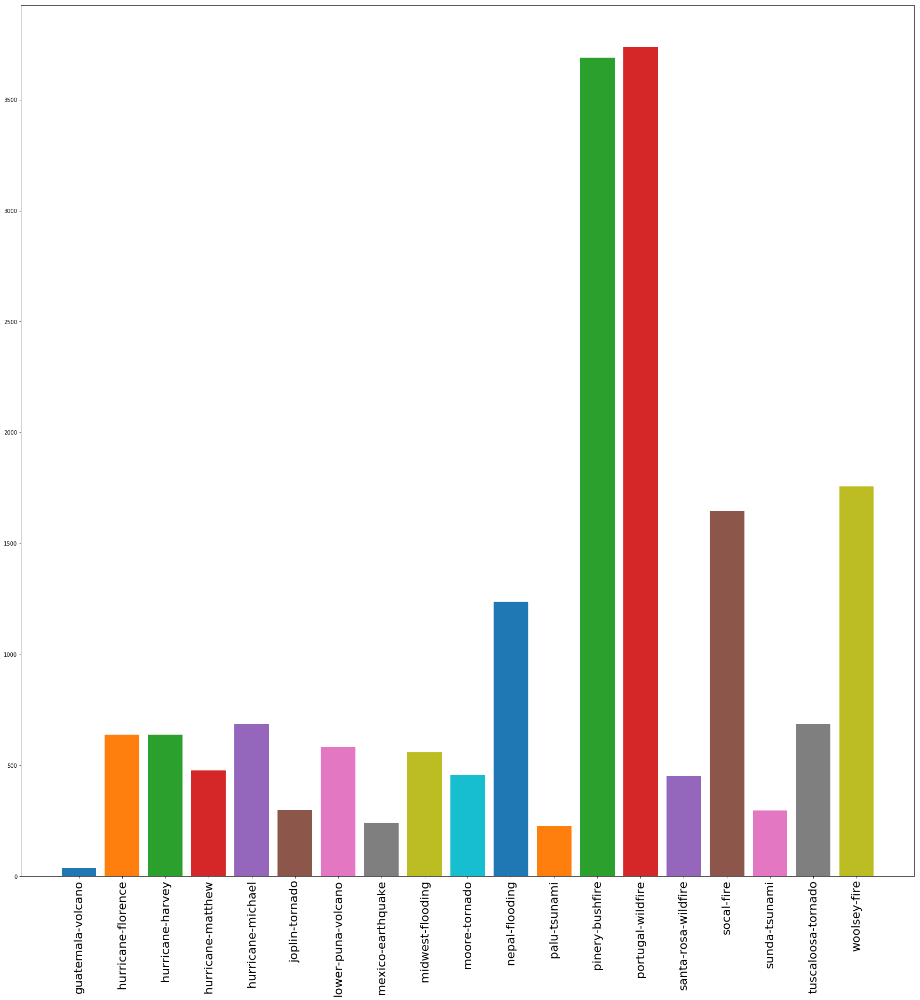

In [41]:
plot_bargraph(full_df, x='disaster', y='gsd', agg_func='count')